**THIS CHAPTER IS CURRENTLY UNDER CONSTRUCTION!!!**

(learning)=
# Learning



(likelihood-learning-sec)=
## A first look at likelihood-based learning objectives

To help motivate the learning objectives obtained in this section, let's begin with a simple example. Suppose that we have an observed dataset

$$
x_1,x_2,\ldots,x_m \in \{0,1\}
$$

drawn from a random variable $X \sim \Ber(\theta)$ with unknown parameter $\theta \in [0,1]$. This is a very simple example of a probabilistic graphical model whose underlying graph consists of only two nodes, one for the parameter $\theta$ and one for the (observed) random variable $X$:

```{image} ../img/bern-pgm.svg
:width: 18%
:align: center
```
&nbsp;

The probability measure $P_\theta$ proposed by the model has mass function

$$
p(x;\theta) = \theta^x (1-\theta)^{1-x},
$$ (bern-model-eq)

for $x\in \{0,1\}$, while the dataset has its empirical probability measure $\hat{P}$ with mass function $\hat{p}(x)$ defined as

$$
\hat{p}(x) = \frac{\text{frequency of $x$ in the dataset}}{m} = \begin{cases}
\displaystyle\frac{\Sigma x}{m} & : x=1, \\
\displaystyle\frac{m - \Sigma x}{m} & : x=0,
\end{cases}
$$ (bern-empirical-eq)

where $\Sigma x \def x_1 + x_2 + \cdots + x_m$. The goal, of course, is to model the observed dataset with our simple PGM, but the parameter $\theta$ is unknown. An "optimal" value for the parameter will minimize the discrepancy (or "distance") between the two distributions $\hat{P}$ and $P_\theta$. We seek to "learn" this optimal value from the dataset.

```{margin}

Technically, according to {prf:ref}`KL-def`, in order to discuss the KL divergence we must require that the empirical distribution is absolutely continuous with respect to the model distribution, in the sense that $p(x;\theta)=0$ implies $\hat{p}(x)=0$ for all $x$. This may create some minor headaches that require addressing special cases in proofs. For an example, see the proof of {prf:ref}`bern-mle-thm` below.
```

Of course, by now we know that "distance" means KL divergence, so the goal is to locate the minimizer

$$
\theta^\star = \argmin_{\theta\in [0,1]} D(\hat{P} \parallel P_\theta).
$$

But from {prf:ref}`KL-and-entropy-thm`, the KL divergence may be expressed as a difference of two entropies,

$$
D(\hat{P} \parallel P_\theta) = H_{\hat{P}}(P_\theta) - H(\hat{P}),
$$

and since the entropy $H(\hat{P})$ does not depend on $\theta$ it may be dropped from the optimization objective, and we see that we are equivalently searching for the minimizer of cross entropy:

$$
\theta^\star = \argmin_{\theta\in [0,1]} H_{\hat{P}}(P_\theta).
$$

Let's unpack this cross entropy, using {eq}`bern-model-eq` and {eq}`bern-empirical-eq`. By definition, we have

$$
H_{\hat{P}}(P_\theta) = E_{x \sim \hat{p}(x)} \left[ I_{P_\theta}(x) \right],
$$ (cross-ent-stoch-eq)

where $I_{P_\theta}(x) = -\log\left[ p(x;\theta) \right]$ might be called the _model surprisal function_. So, we have

\begin{align*}
E_{x \sim \hat{p}(x)} \left[ I_{P_\theta}(x) \right] &= -\sum_{x\in \bbr} \hat{p}(x) \log\left[ p(x;\theta) \right] \\
&= - \hat{p}(1) \log\left[p(1;\theta) \right] - \hat{p}(0) \log\left[ p(0;\theta)\right]  \\
&= -\frac{1}{m} \left[ \Sigma x \log(\theta) + (m-\Sigma x)\log(1-\theta) \right] \\
&= -\frac{1}{m} \log\left[ \theta^{\Sigma x} (1-\theta)^{m - \Sigma x}\right].
\end{align*}

By independence of the observed dataset, we have

$$
p(x_1,\ldots,x_m; \theta) = \prod_{i=1}^m p(x_i;\theta) = \prod_{i=1}^m \theta^{x_i} (1-\theta)^{1-x_i} = \theta^{\Sigma x} (1-\theta)^{m-\Sigma x}.
$$

Using the terminology from {numref}`Chapter %s <prob-models>`, this latter joint probability mass function might be called the _data probability mass function_. It is then natural to call

$$
I_{P_\theta}(x_1,\ldots,x_m) \def - \log\left[ p(x_1,\ldots,x_m;\theta) \right]
$$ (data-sur-eq)

the _data surprisal function_. So, putting everything together, we get that

$$
D(\hat{P} \parallel P_\theta) + H(\hat{P}) = H_{\hat{P}}(P_\theta) = E_{x \sim \hat{p}(x)} \left[ I_{P_\theta}(x) \right] \propto I_{P_\theta}(x_1,\ldots,x_m),
$$ (list-objs-eq)

where the constant of proportionality is the (positive) number $1/m$. Moreover, since the negative logarithm function is strictly decreasing, minimizing the data surprisal function {eq}`data-sur-eq` with respect to $\theta$ is equivalent to maximizing the data probability mass function $p(x_1,\ldots,x_m; \theta)$ with respect to $\theta$. In this context, this latter mass function is called the _data likelihood function_. If we combine all of our observations into a single theorem, we get:

```{margin}

As mentioned in the margin note above, in this theorem we are implicitly restricting our attention to those parameters $\theta$ for which the empirical distribution $\hat{P}$ is absolutely continuous with respect to the model distribution $P_\theta$.
```

```{prf:theorem} Equivalent learning objectives for the simple Bernoulli model
:label: equiv-obj-bern-thm

Let $ x_1,x_2,\ldots,x_m \in \{0,1\}$ be an observed dataset corresponding to a Bernoulli random variable $X\sim \Ber(\theta)$ with unknown $\theta$. Let $P_\theta$ be the model distribution of $X$ and let $\hat{P}$ be the empirical distribution of the dataset. The following optimization objectives are equivalent:

1. Minimize the KL divergence $D(\hat{P} \parallel P_\theta)$ with respect to $\theta$.
2. Minimize the cross entropy $H_{\hat{P}}(P_\theta)$ with respect to $\theta$.
3. Minimize the data surprisal function $I_{P_\theta}(x_1,\ldots,x_m)$ with respect to $\theta$.
4. Maximize the data likelihood function $p(x_1,\ldots,x_m;\theta)$ with respect to $\theta$.
```

Though these optimization objectives are all equivalent to each other, they have different interpretations, conceptualizations, and advantages:

> 1. Minimizing the KL divergence between the empirical and model distributions has an immediate and concrete interpretation as minimizing the "distance" between these two distributions.
> 2. As a function of $\theta$, the cross entropy $H_{\hat{P}}(P_\theta)$ may be viewed as a stochastic objective function, since it is exactly the mean of the model surprisal function; see {eq}`cross-ent-stoch-eq` above. This opens the door for applications of the stochastic gradient descent algorithm studied in {numref}`sgd-sec`.
> 3. The third optimization objective seeks the model probability distribution according to which the data is _least surprising_.
> 4. The fourth optimization objective seeks the model probability distribution according to which the data is _most likely_.

Due to the equivalence with the fourth optimization objective, all these optimization objectives are referred to as _likelihood-based learning objectives_. The optimization process is then called _maximum likelihood estimation_ (*MLE*), and the value

\begin{align*}
\theta^\star_\text{MLE} &\def \argmax_{\theta \in [0,1]} p(x_1,\ldots,x_m;\theta) \\
&= \argmin_{\theta \in [0,1]} I_{P_\theta}(x_1,\ldots,x_m) \\
&= \argmin_{\theta \in [0,1]} H_{\hat{P}}(P_\theta) \\
&= \argmin_{\theta \in [0,1]} D(\hat{P} \parallel P_\theta)
\end{align*}

is called the _maximum likelihood estimate_ (also _MLE_). But in actual real-world practice, nobody _ever_ maximizes the likelihood function directly due to numerical instability (and other reasons), and instead one of the other three learning objectives is used. Due to this, we prefer the terminology _surprisal-based learning objectives_.

It will turn out that an identical version of {prf:ref}`equiv-obj-bern-thm` holds for all probabilistic graphical models with discrete model distributions, not just our simple Bernoulli model. But for the Bernoulli model, the MLE may be computed in closed form:

```{prf:theorem} MLE for the simple Bernoulli model
:label: bern-mle-thm

Let $ x_1,x_2,\ldots,x_m \in \{0,1\}$ be an observed dataset corresponding to a Bernoulli random variable $X\sim \Ber(\theta)$ with unknown $\theta$. Then the (unique) maximum likelihood estimate $\theta^\star_\text{MLE}$ is the ratio $ \Sigma x/m$.
```

```{prf:proof}
We first address the special cases that $\Sigma x =0$ or $m$. In the first case, the data likelihood function is given by

$$
p(x_1,\ldots,x_m; \theta) = \theta^{\Sigma x} (1-\theta)^{m-\Sigma x} = (1-\theta)^m.
$$

But the latter expression is maximized at $\theta^\star=0$, and so $\theta^\star_\text{MLE} = \Sigma x/m$, as claimed. A similar argument shows that if $\Sigma x = m$, then the likelihood function is maximized at $\theta^\star = 1$, and so $\theta^\star_\text{MLE} = \Sigma x / m$ again.

So, we may assume that $0 < \Sigma x < m$. In this case, the maximizer of the likelihood function must occur in the open interval $(0,1)$. Thus, by {prf:ref}`equiv-obj-bern-thm`, the parameter $\theta^\star_\text{MLE}$ is equivalently the global minimizer of the data surprisal function

$$
I_{P_\theta}(x_1,\ldots,x_m) = -\Sigma x \log{\theta} - (m-\Sigma x) \log{(1-\theta)}.
$$

But minimizers of this function can only occur at points $\theta^\star \in (0,1)$ where

$$
\frac{\text{d}}{\text{d} \theta}\Bigg|_{\theta = \theta^\star} I_{P_\theta}(x_1,\ldots,x_m) = 0.
$$ (sur-station-eq)

But 

$$
\frac{\text{d}}{\text{d} \theta} I_{P_\theta}(x_1,\ldots,x_m) = -\frac{\Sigma x}{\theta} + \frac{m-\Sigma x}{1-\theta},
$$

and a little algebra yields the solution $\theta^\star = \Sigma x/m$ to the stationarity equation {eq}`sur-station-eq`. To confirm that $\theta^\star = \Sigma x/m$ is a global minimizer over $(0,1)$, note that the second derivatives of both $-\log{\theta}$ and $-\log{(1-\theta)}$ are always positive, and hence the data surprisal function is strictly convex. Thus, $\theta^\star_\text{MLE} = \Sigma x/m$ must indeed be the (unique) MLE. Q.E.D.
```

Though the $\theta^\star_\text{MLE}$ is available in closed form for our simple Bernoulli model, it is still amusing to search for $\theta^\star$ by running stochastic gradient descent on the stochastic objective function given by cross entropy:

$$
H_{\hat{P}}(P_\theta) = E_{x\sim \hat{p}(x)} \left[ I_{P_\theta}(x) \right].
$$

To create the following figure, we generated a sequence of $128$ observations

$$
x_1,x_2,\ldots,x_{128} \in \{0,1\}
$$

with $\Sigma x = 87$. Then, a run of mini-batch gradient descent yields the following:

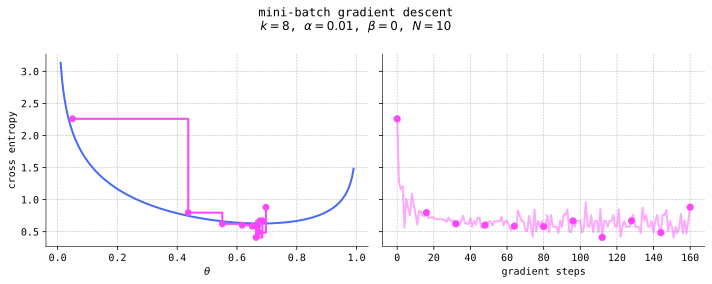

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import torch
import torch.nn.functional as F
import torch.nn as nn
from math import sqrt
import sys
sys.path.append('/Users/johnmyers/code/stats-book-materials/notebooks')
from gd_utils import GD, SGD
import matplotlib_inline.backend_inline
import matplotlib.colors as clr
plt.style.use('../aux-files/custom_style_light.mplstyle')
matplotlib_inline.backend_inline.set_matplotlib_formats('svg')
import warnings
warnings.filterwarnings('ignore', category=UserWarning)
blue = '#486AFB'
magenta = '#FD46FC'

torch.manual_seed(42)
theta = 0.65
m = 128
X = torch.bernoulli(torch.tensor([theta] * m))

def g(X, parameters):
    theta = parameters['theta']
    return -X * torch.log(theta) - (1 - X) * torch.log(1 - theta)

def cross_entropy(theta):
    Sigmax = sum(X)
    return -(1 / m) * (Sigmax * np.log(theta) + (m - Sigmax) * np.log(1 - theta))

parameters = {'theta': torch.tensor([0.05])}
alpha = 0.01
k = 8
N = 10

sgd_output = SGD(g=g, init_parameters=parameters, X=X, lr=alpha, batch_size=k, num_epochs=N)

epoch_step_nums = sgd_output.epoch_step_nums
objectives = sgd_output.per_step_objectives[epoch_step_nums]
running_parameters = sgd_output.parameters['theta']
running_parameters = running_parameters[epoch_step_nums]
grid = np.linspace(start=0.01, stop=0.99, num=200)

_, axes = plt.subplots(ncols=2, figsize=(10, 4), sharey=True)

axes[0].plot(grid, cross_entropy(grid))
axes[0].step(running_parameters, objectives, where='post', color=magenta)
axes[0].scatter(running_parameters, objectives, color=magenta, s=45, zorder=3)
axes[0].set_xlabel('$\\theta$')
axes[0].set_ylabel('cross entropy')

axes[1].plot(range(len(sgd_output.per_step_objectives)), sgd_output.per_step_objectives, color=magenta, alpha=0.45)
axes[1].scatter(epoch_step_nums, objectives, s=50, color=magenta, zorder=3)
axes[1].set_xlabel('gradient steps')

plt.suptitle(f'mini-batch gradient descent\n$k={k}$, $\\alpha = {alpha}$, $\\beta=0$, $N = {N}$')
plt.tight_layout()

The blue curve in the left-hand plot is the graph of the _exact_ cross entropy function $H_{\hat{P}}(P_\theta)$. The magenta points---which represent a selection of outputs of the algorithm---do not fall _precisely_ on this graph since they are _approximations_ to the cross entropy, obtained as realizations of the expression on the right-hand side of

$$
H_{\hat{P}}(P_\theta) \approx \frac{1}{8} \sum_{x\in B} I_{P_\theta}(x),
$$

where $B$ is a mini-batch of data of size $k=8$. (This was discussed right after we introduced {prf:ref}`sgd-alg` in {numref}`Chapter %s <optim>`.) On the right-hand size of the figure, we have plotted the (approximate) cross entropy versus gradient steps, a type of plot familiar from {numref}`Chapter %s <optim>`. The magenta dots on the two sides of the figure correspond to each other; they represent the (approximate) cross entropies every 16 gradient steps ($=1$ epoch). Notice that the algorithm appears to be converging to the true value $\theta^\star_\text{MLE} = 87/128 \approx 0.68$ given by {prf:ref}`bern-mle-thm`.












## MLE for linear regression

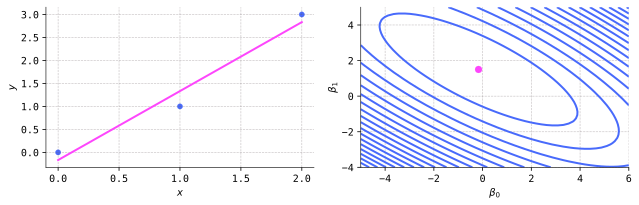

In [2]:
# toy data
X = np.array([[1, 0], [1, 1], [1, 2]])
y = np.array([0, 1, 3]).reshape(-1, 1)

# MLEs for parameters
beta0, beta1 = -1 / 6, 3 / 2

# define objective function
def J(theta, X, y):
    return -0.5 * np.linalg.norm(y - X @ theta, axis=0) ** 2

# define grid
x_grid = np.linspace(-5, 6)
y_grid = np.linspace(-4, 5)
x_grid, y_grid = np.meshgrid(x_grid, y_grid)
grid = np.column_stack((x_grid.reshape(-1, 1), y_grid.reshape(-1, 1))).T
z = J(grid, X, y).reshape(x_grid.shape)

# plot
_, axes = plt.subplots(ncols=2, figsize=(9, 3))

grid = np.linspace(0, 2)
axes[0].scatter(X[:, 1], y, s=30)
axes[0].plot(grid, beta0 + beta1 * grid, color=magenta)
axes[0].set_xlabel('$x$')
axes[0].set_ylabel('$y$')

axes[1].contour(x_grid, y_grid, z, levels=20, colors=blue, linestyles='solid')
axes[1].scatter([beta0], [beta1], s=50, color=magenta)
axes[1].set_xlabel('$\\beta_0$')
axes[1].set_ylabel('$\\beta_1$')

plt.tight_layout()

## MLE for logistic regression

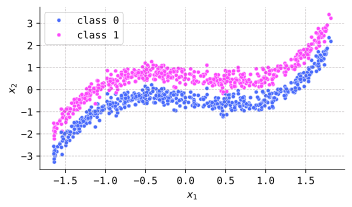

In [3]:
url = 'https://raw.githubusercontent.com/jmyers7/stats-book-materials/main/data/ch12-book-data-01.csv'
df = pd.read_csv(url)

# convert the data to numpy arrays
X = df[['x_1', 'x_2']].to_numpy()
y = df['y'].to_numpy()

# convert the data to torch tensors
X = torch.tensor(data=X, dtype=torch.float32)
y = torch.tensor(data=y, dtype=torch.float32)

# plot the data
g = sns.scatterplot(data=df, x='x_1', y='x_2', hue='y')

# change the default seaborn legend
g.legend_.set_title(None)
new_labels = ['class 0', 'class 1']
for t, l in zip(g.legend_.texts, new_labels):
    t.set_text(l)

plt.xlabel('$x_1$')
plt.ylabel('$x_2$')
plt.gcf().set_size_inches(w=5, h=3)
plt.tight_layout()

In [4]:
# define the link function at Y
def phi(X, parameters):
    beta0 = parameters['beta0']
    beta = parameters['beta']
    return torch.sigmoid(beta0 + X @ beta)

# define the data surprisal function
def I(parameters):
    probs = phi(X, parameters)
    return torch.sum(-y * torch.log(probs) - (1 - y) * torch.log(1 - probs))

# define the predictor
def predictor(X, parameters):
    probs = phi(X, parameters)
    return (probs >= 0.5).to(torch.int)

# initialize the weights and biases
torch.manual_seed(42)
beta0 = torch.normal(mean=0, std=1e-1, size=(1,))
beta = torch.normal(mean=0, std=1e-1, size=(2,))
theta0 = {'beta0': beta0, 'beta': beta}

# run gradient descent
N = 50
alpha = 1e-3
gd_output = GD(J=I, init_parameters=theta0, lr=alpha, num_steps=N)

# define grid for contour plot
resolution = 1000
x1_grid = torch.linspace(-2, 2, resolution)
x2_grid = torch.linspace(-4, 4, resolution)
x1_grid, x2_grid = torch.meshgrid(x1_grid, x2_grid)
grid = torch.column_stack((x1_grid.reshape((resolution ** 2, -1)), x2_grid.reshape((resolution ** 2, -1))))

# define colormap for the contour plots
desat_blue = '#7F93FF'
desat_magenta = '#FF7CFE'
binary_cmap = clr.LinearSegmentedColormap.from_list(name='binary', colors=[desat_blue, desat_magenta], N=2)

epoch_list = [0, 3, N]
running_parameters = gd_output.parameters

_, axes = plt.subplots(ncols=2, nrows=len(epoch_list), figsize=(10, 9))

for i, epoch in enumerate(epoch_list):
    parameters = {key: value[epoch] for key, value in running_parameters.items()}
    
    # plot the objective function
    axes[i, 0].plot(range(len(gd_output.objectives)), gd_output.objectives)
    axes[i, 0].set_xlabel('gradient steps')
    axes[i, 0].set_ylabel('data surprisal')
    axes[i, 0].scatter(epoch_list[i], gd_output.objectives[epoch], color=magenta, s=100, zorder=3)

    # apply the fitted model to the grid
    z = predictor(grid, parameters)

    # plot the decision boundary and colors
    z = z.reshape(shape=(resolution, resolution))
    axes[i, 1].contourf(x1_grid, x2_grid, z, cmap=binary_cmap)
    axes[i, 1].set_xlabel('$x_1$')
    axes[i, 1].set_ylabel('$x_2$')

    # plot the data
    g = sns.scatterplot(data=df, x='x_1', y='x_2', hue='y', ax=axes[i, 1])

    # change the default seaborn legend
    g.legend_.set_title(None)
    new_labels = ['class 0', 'class 1']
    for t, l in zip(g.legend_.texts, new_labels):
        t.set_text(l)
    
plt.tight_layout()

## MLE for neural networks

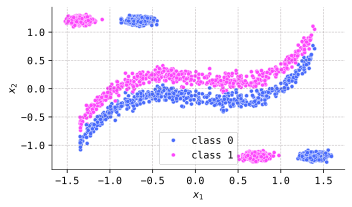

In [5]:
url = 'https://raw.githubusercontent.com/jmyers7/stats-book-materials/main/data/ch12-book-data-02.csv'
df = pd.read_csv(url)

# convert the data to numpy arrays
X = df[['x_1', 'x_2']].to_numpy()
y = df['y'].to_numpy()

# convert the data to torch tensors
X = torch.tensor(data=X, dtype=torch.float32)
y = torch.tensor(data=y, dtype=torch.float32)

# plot the data
g = sns.scatterplot(data=df, x='x_1', y='x_2', hue='y')

# change the default seaborn legend
g.legend_.set_title(None)
new_labels = ['class 0', 'class 1']
for t, l in zip(g.legend_.texts, new_labels):
    t.set_text(l)

plt.xlabel('$x_1$')
plt.ylabel('$x_2$')
plt.gcf().set_size_inches(w=5, h=3)
plt.tight_layout()

In [6]:
# define the link function at Y
def phi(X, parameters):
    Z_0 = X
    Z_1 = F.relu(Z_0 @ parameters['weight_1'] + parameters['bias_1'])
    Z_2 = F.relu(Z_1 @ parameters['weight_2'] + parameters['bias_2'])
    Z_3 = F.relu(Z_2 @ parameters['weight_3'] + parameters['bias_3'])
    return torch.sigmoid(Z_3 @ parameters['weight_4'] + parameters['bias_4'])

# define the model surprisal function
def I(X, y, parameters):
    probs = phi(X, parameters)
    return -y * torch.log(probs) - (1 - y) * torch.log(1 - probs)

# define the predictor
def predictor(X, parameters):
    probs = phi(X, parameters)
    return (probs >= 0.5).to(torch.int)

# define the network architecture
k1 = 8 # width of first hidden layer
k2 = 8 # width of second hidden layer
k3 = 4 # width of third hidden layer
widths = [2, k1, k2, k3, 1]

# initialize the weights and biases
torch.manual_seed(42)
theta0 = {}
for i in range(1, 5):
    weight = torch.empty(widths[i-1], widths[i])
    bias = torch.empty(widths[i])
    nn.init.uniform_(weight, a=-1/sqrt(widths[i-1]), b=1/sqrt(widths[i-1]))
    nn.init.uniform_(bias, a=-1/sqrt(widths[i-1]), b=1/sqrt(widths[i-1]))
    theta0 = theta0 | {'weight_' + str(i): weight.squeeze()}
    theta0 = theta0 | {'bias_' + str(i): bias}

# run SGD
N = 80
k = 128
alpha = 0.1
sgd_output = SGD(g=I, init_parameters=theta0, X=X, y=y, lr=alpha, batch_size=k, num_epochs=N, random_state=42)

# get the grid for the contour plot
resolution = 1000
x1_grid = torch.linspace(-1.75, 1.75, resolution)
x2_grid = torch.linspace(-1.5, 1.5, resolution)
x1_grid, x2_grid = torch.meshgrid(x1_grid, x2_grid)
grid = torch.column_stack((x1_grid.reshape((resolution ** 2, -1)), x2_grid.reshape((resolution ** 2, -1))))

epoch_list = [0, 750, len(sgd_output.per_step_objectives) - 1]
running_parameters = sgd_output.parameters

_, axes = plt.subplots(ncols=2, nrows=len(epoch_list), figsize=(10, 9))

for i, epoch in enumerate(epoch_list):
    parameters = {key: value[epoch] for key, value in running_parameters.items()}
    
    # plot the objective function
    axes[i, 0].plot(sgd_output.grad_steps, sgd_output.per_step_objectives, alpha=0.25, label='per step cross entropy')
    axes[i, 0].plot(sgd_output.epoch_step_nums, sgd_output.per_epoch_objectives, label='per epoch mean cross entropy')
    axes[i, 0].set_xlabel('gradient steps')
    axes[i, 0].set_ylabel('cross entropy')
    axes[i, 0].scatter(epoch_list[i], sgd_output.per_step_objectives[epoch], color=magenta, s=100, zorder=3)
    axes[i, 0].legend()

    # apply the fitted model to the grid
    z = predictor(grid, parameters)

    # plot the decision boundary and colors
    z = z.reshape(shape=(resolution, resolution))
    axes[i, 1].contourf(x1_grid, x2_grid, z, cmap=binary_cmap)
    axes[i, 1].set_xlabel('$x_1$')
    axes[i, 1].set_ylabel('$x_2$')

    # plot the data
    g = sns.scatterplot(data=df, x='x_1', y='x_2', hue='y', ax=axes[i, 1])

    # change the default seaborn legend
    g.legend_.set_title(None)
    new_labels = ['class 0', 'class 1']
    for t, l in zip(g.legend_.texts, new_labels):
        t.set_text(l)
    
plt.tight_layout()